# Exploratory data analysis: Bike Sharing Dataset

In [1]:
# Load packages
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import altair as alt
from sklearn.model_selection import train_test_split
import pandas as pd
import seaborn as sns
pd.set_option("display.max_colwidth", 200)
%matplotlib inline
alt.data_transformers.disable_max_rows()
from scipy.stats import pearsonr

#add this because I use jupyter notebook
alt.renderers.enable('notebook')

RendererRegistry.enable('notebook')

## 1. Description of the dataset

 The dataset we chose is the Bike Sharing Dataset from [UCI machine learning repository](https://archive.ics.uci.edu/ml/datasets/bike+sharing+dataset). This dataset contains the hourly and daily count of rental bikes in 2011 and 2012 in Capital bikeshare system in Washington, DC with the corresponding weather and seasonal information. It is provided by Hadi Fanaee-T, Laboratory of Artificial Intelligence and Decision Support (LIAAD), University of Porto.  
For the purpose of this project, we would use the hourly dataset, which is more complete and have a greater number of observations than the daily dataset.

## 2. Load the dataset

We downloaded and splitted the dataset into 80% train set and 20% test using the [download script]("https://github.com/UBC-MDS/DSCI_522_Group_409/blob/master/src/data_download.py") in our group repo.

In [2]:
# Load the dataset
bike_data = pd.read_csv("../data/training_data.csv")
# bike_data_train = pd.read_csv("../data/training_data.csv")
# bike_data_train_target = pd.read_csv("../data/test_data.csv")

# # Combine the feature and target
# bike_data = pd.concat([bike_data_train, bike_data_train_target], axis = 1)

# # Preview
bike_data

,season,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
0,1,1,1,0,Saturday,0,1,18.34,33.9982,80.0,14.412186,40
1,1,1,4,0,Saturday,0,1,19.28,35.0014,75.0,14.412186,1
2,1,1,5,0,Saturday,0,2,19.28,33.0016,75.0,6.003200,1
3,1,1,7,0,Saturday,0,1,17.40,33.0016,86.0,14.412186,3
4,1,1,8,0,Saturday,0,1,19.28,35.0014,75.0,14.412186,8
...,...,...,...,...,...,...,...,...,...,...,...,...
13899,1,12,18,0,Monday,1,2,20.22,33.9982,48.0,8.998100,122
13900,1,12,19,0,Monday,1,2,20.22,33.0016,60.0,11.001400,119
13901,1,12,20,0,Monday,1,2,20.22,33.0016,60.0,11.001400,89
13902,1,12,21,0,Monday,1,1,20.22,33.0016,60.0,11.001400,90


## 3. Explore the dataset

### 3.1 Pandas Profile Report
We initially explored this dataset by using the pandas profile report. 

In [3]:
profile = ProfileReport(bike_data)
profile

**Findings from the pandas profile report:**
1. The target `cnt` (i.e. count of total rental bikes) is highly correlated with `registered` (i.e. count of registered users). Since our research question does not care about whether the user is registered or casual users. We decided to remove `registered` and `casual` columns.
2. The report is showing that `temp` and `atemp` are highly correlated with each other. They both are normalized temperatures in Celsius while `atemp` is the feeling temperature and `temp` is the real temperature. We decided to create a new column called `temp_actual` (i.e. the non-normalized actual temperature) and remove `temp` and `atemp` columns.
3. `dtday` is a DateTime column, which has a high cardinality. We decided to remove it because there are other time-related columns, such as `mnth` and `hr`, we can use to answer our research question.

### 3.2 Further explore

After using pandas profile report, we also did further exploring in some useful features in our dataset as below.

In [3]:
bike_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13904 entries, 0 to 13903
Data columns (total 12 columns):
season        13904 non-null int64
mnth          13904 non-null int64
hr            13904 non-null int64
holiday       13904 non-null int64
weekday       13904 non-null object
workingday    13904 non-null int64
weathersit    13904 non-null int64
temp          13904 non-null float64
atemp         13904 non-null float64
hum           13904 non-null float64
windspeed     13904 non-null float64
cnt           13904 non-null int64
dtypes: float64(4), int64(7), object(1)
memory usage: 1.3+ MB


In [4]:
bike_data.describe()
#table_descr.to_csv("tab_1.csv", index = True)

,season,mnth,hr,holiday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
count,13904.000000,13904.000000,13904.000000,13904.000000,13904.000000,13904.000000,13904.000000,13904.000000,13904.000000,13904.000000,13904.000000
mean,2.505538,6.546461,11.525892,0.029848,0.685486,1.426928,31.364314,47.405899,62.624856,14.318887,189.624353
std,1.106875,3.442690,6.892224,0.170173,0.464339,0.640960,9.068496,11.368406,19.283209,6.689130,181.696974
min,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,8.940000,16.000000,0.000000,6.003200,1.000000
25%,2.000000,4.000000,6.000000,0.000000,0.000000,1.000000,23.980000,37.997800,47.000000,8.998100,40.000000
50%,3.000000,7.000000,12.000000,0.000000,1.000000,1.000000,31.500000,47.996800,62.000000,12.998000,142.000000
75%,3.000000,10.000000,17.000000,0.000000,1.000000,2.000000,39.020000,56.999200,78.000000,16.997900,281.000000
max,4.000000,12.000000,23.000000,1.000000,1.000000,4.000000,55.000000,82.000000,100.000000,56.996900,977.000000


In [5]:
print("The dataframe columns are: ", list(bike_data.columns), "\n")

month_list = sorted(list(bike_data['mnth'].unique()))
print("- The month ranges from {0} to {1}, which represents the {2} months of the year.".format(month_list[0],
                                                                           month_list[-1],
                                                                           len(month_list)),"\n")

hour_list = sorted(list(bike_data['hr'].unique()))
print("- The hour ranges from {0} to {1}, that represents the {2} hours of the day.".format(hour_list[0],
                                                                           hour_list[-1],
                                                                           len(hour_list)),"\n")

print("- The holiday type contains: ", list(bike_data['holiday'].unique()),"\n")

weekdays = sorted(list(bike_data['weekday'].unique()))
print("- The weekday type contains: ", weekdays,"\n")

print("- The workingday type contains: ", sorted(list(bike_data['workingday'].unique())),"\n")

print("- The weather type contains: ", list(bike_data['weathersit'].unique()),"\n")

temp_list = sorted(list(bike_data['temp'].unique()))
print("- The normalized tempereature ranges from {0} to {1}".format(temp_list[0],
                                                                    temp_list[-1]), "\n")

hum_list = sorted(list(bike_data['temp'].unique()))
print("- The normalized humidity ranges from {0} to {1}".format(hum_list[0],
                                                                hum_list[-1]), "\n")

wind_list = sorted(list(bike_data['windspeed'].unique()))
print("- The normalized windspeed ranges from {0} to {1}".format(wind_list[0],
                                                                wind_list[-1]), "\n")

cnt_list = sorted(list(bike_data['cnt'].unique()))
print("- The target count of bike rentals ranges from {0} to {1}".format(cnt_list[0],
                                                                cnt_list[-1]), "users.\n")

The dataframe columns are:  ['season', 'mnth', 'hr', 'holiday', 'weekday', 'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed', 'cnt'] 

- The month ranges from 1 to 12, which represents the 12 months of the year. 

- The hour ranges from 0 to 23, that represents the 24 hours of the day. 

- The holiday type contains:  [0, 1] 

- The weekday type contains:  ['Friday', 'Monday', 'Saturday', 'Sunday', 'Thursday', 'Tuesday', 'Wednesday'] 

- The workingday type contains:  [0, 1] 

- The weather type contains:  [1, 2, 3, 4] 

- The normalized tempereature ranges from 8.94 to 55.0 

- The normalized humidity ranges from 8.94 to 55.0 

- The normalized windspeed ranges from 6.0032 to 56.9969 

- The target count of bike rentals ranges from 1 to 977 users.



**Findings from further exploring**:
1. We found that most of the features are already normalized, which would be great when building the machine learning model.
2. During EDA, 3 columns (i.e. `temp`, `hum`, `windspeed`) required to be transformed back to the non-normalized numbers so that we can better interpret the relationship between these features and the target.
3. There are 4 categorical columns (i.e. `holiday, weekday`, `workingday`, `weatherday`) which are already coded as numbers (binary variables) in the dataset. We will use the descriptions from the source website to interpret these columns in our analysis.

    - `holiday` : 1 for holiday, 0 for non-holiday
    - `weekday` : Day of the week, starting from Sunday as 0 until Saturday as 6
    - `workingday` : 1 for workingday, 0 for weekends and holidays.
    - `weathersit` : 
        - 1: Clear, Few clouds, Partly cloudy, Partly cloudy 
        - 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist 
        - 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds 
        - 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog 
    - `temp` : real temperature with values normalized considering t_min=-8, t_max=+39.
    - `atemp` : feeling temperature with values normalized considering t_min=-16, and t_max=+50.
    - `hum` : normalized humidity, which values are divided to 100 (max).
    - `windspeed` : normalized wind speed, which values are divided to 67 (max).

### 3.3 Checking the Null Values in the dataset

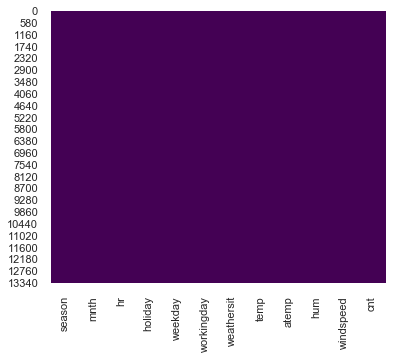

In [6]:
sns.set(rc={'figure.figsize':(6,5)})
sns.heatmap(bike_data.isnull(), cmap='viridis', cbar=False)

In [7]:
# nulls in any varliable
pd.DataFrame(bike_data[bike_data.isnull().any(axis=1)])

,season,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt


**Findings**: As we can see from the plot and dataframe above, there is no null values in the dataset.

## 4. Initial Thoughts

Some findings and important observations:  
- The original dataset has 17 variables with 13,903 observations, but not all variables would be useful for the model: in some cases, the variables are highly correlated as `temp` and `atemp`, and other variables that won't be as useful as `instant` that is the id. of the observation.  
- The operation of the bike rentals runs 24 hr even on weekends and holidays. However, if we consider that the target variable `cnt` ranges from 1 to 977 users, we could find out that there are no observations for some combinations of hours and days (probably because nobody rent any bike in that specific moment); for example, there is no data at 10 am of January 2nd of 2012 (dteday='2012-01-02', yr=10).
- The real temperature (`temp`) and feeling temperature `atemp` are normalized with different scales, which can be confusing to interpret.
- The original source of the data comes from the company [Capital Bikeshare](https://s3.amazonaws.com/capitalbikeshare-data/index.html) which in their website have a section to [download the bike rental files](https://s3.amazonaws.com/capitalbikeshare-data/index.html) from September 2010 until November 2019. These files have the information rent with variables as day, time, bike id., start and end stations, and member type; however, these files don't include other useful information as holidays, weather, temperature, humidity and wind speed that could affect the number of bike rentals and are included in the dataset that we are interested to use. For this reason, it would be better to work with the information retrieved from the [UCI machine learning repository](https://archive.ics.uci.edu/ml/datasets/bike+sharing+dataset).

In [8]:
bike_data

,season,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
0,1,1,1,0,Saturday,0,1,18.34,33.9982,80.0,14.412186,40
1,1,1,4,0,Saturday,0,1,19.28,35.0014,75.0,14.412186,1
2,1,1,5,0,Saturday,0,2,19.28,33.0016,75.0,6.003200,1
3,1,1,7,0,Saturday,0,1,17.40,33.0016,86.0,14.412186,3
4,1,1,8,0,Saturday,0,1,19.28,35.0014,75.0,14.412186,8
...,...,...,...,...,...,...,...,...,...,...,...,...
13899,1,12,18,0,Monday,1,2,20.22,33.9982,48.0,8.998100,122
13900,1,12,19,0,Monday,1,2,20.22,33.0016,60.0,11.001400,119
13901,1,12,20,0,Monday,1,2,20.22,33.0016,60.0,11.001400,89
13902,1,12,21,0,Monday,1,1,20.22,33.0016,60.0,11.001400,90



## 5. Wrangling

In [9]:
# THIS WRANGING IS NOT NECESARY IN THE EDA BECAUSE IT WAS ADDRESSED IN THE
# WRANGLING SCRIPT THAT RETURNS THE FILE WE USE HERE FOR THE ANALYSIS.


# # Drop the unnecssary columns discussed in Section 3
# bike_data = bike_data.drop(['instant', 'dteday', 'yr', 'atemp', 'casual', 'registered'], axis = 1)

# # Create a new non-normalized actual temperature column and remove the `temp` column
# bike_data['temp_actual'] = bike_data['temp'].apply(lambda x: x*47 - 8)
# bike_data = bike_data.drop(['temp'], axis = 1)

# # Transform wind speed and humidity columns and get non-normalized variables (`windspeed` and `hum`)
# bike_data['windspeed'] = bike_data['windspeed'].apply(lambda x: x*67)
# bike_data['hum'] = bike_data['hum'].apply(lambda x: x*100)




# # Transform the weekday column back to categorical
# bike_data['weekday'] = bike_data['weekday'].replace(
#                                 {0: 'Sunday',
#                                  1: 'Monday',
#                                  2: 'Tuesday',
#                                  3: 'Wednesday',
#                                  4: 'Thursday',
#                                  5: 'Friday',
#                                  6: 'Saturday'})

# bike_data

In [10]:
# group by weekday and hour to calculate the average cnt for heatmap
bike_data_2 = bike_data.groupby(['weekday', 'hr']).mean().reset_index()
bike_data_2

,weekday,hr,season,mnth,holiday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
0,Friday,0,2.469880,6.542169,0.024096,0.975904,1.445783,30.061687,45.699284,67.602410,12.668260,51.614458
1,Friday,1,2.500000,6.600000,0.012500,0.987500,1.412500,30.090000,45.762783,70.062500,11.768811,25.450000
2,Friday,2,2.500000,6.566667,0.022222,0.977778,1.400000,29.693111,45.322260,72.466667,11.894212,13.433333
3,Friday,3,2.481013,6.531646,0.025316,0.974684,1.341772,29.251139,44.708830,75.544304,10.789987,6.544304
4,Friday,4,2.589041,6.753425,0.000000,1.000000,1.452055,28.886027,44.219249,73.958904,11.853004,6.109589
...,...,...,...,...,...,...,...,...,...,...,...,...
163,Wednesday,19,2.500000,6.634146,0.012195,0.987805,1.524390,33.265366,49.682939,59.268293,15.930407,347.365854
164,Wednesday,20,2.512195,6.512195,0.012195,0.987805,1.451220,32.176341,48.170654,60.707317,15.078129,249.317073
165,Wednesday,21,2.512821,6.653846,0.012821,0.987179,1.384615,32.030256,48.256569,64.179487,14.070692,191.615385
166,Wednesday,22,2.585366,6.841463,0.000000,1.000000,1.451220,30.743415,46.634222,66.402439,13.983988,135.487805


## 6. Research Questions

Our main predictive research question is:
> Given the information shared by Bike share company, can we predict the count of bike rentals in order to forecast the future demand?

The sub-questions is:
> Identify the strongest predictors that can help in predicting the future demand for bike rentals. (predictive)  
<br>
> Identify the regression model that would have a better performance to predict the future demand for bike rentals. (predictive)

## 7. Data Analysis & Visualizations

### 7.1 Analysis of temp on bike rental count 

Would you rent a bike to commute to your work on a 25˚C sunny-day? And how about on a winter day with a temperature below 0˚C?
We believe that the temperature could be an important variable to predict the future demand of bike rentals, so we start our analysis with a faceted plot comparing the temperature with the number of rented bikes, by weekday.

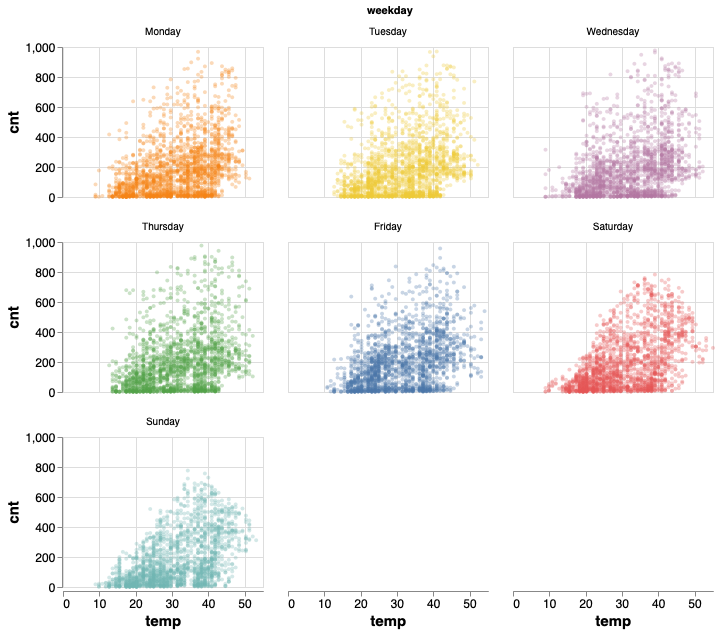

In [11]:
order_of_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 
              'Friday', 'Saturday', 'Sunday']

chart = alt.Chart(bike_data).mark_point(opacity=0.3, size = 4).encode(
            alt.X('temp:Q'),
            alt.Y('cnt:Q'),
            color = alt.Color('weekday:N', legend=None)
        ).properties(title="Temp vs Bike Rental",
                    width=200, height=150
        ).facet(alt.Facet('weekday:N', 
                          sort = order_of_days),
                columns=3
        ).configure_axisX(labelFontSize=12,
                        titleFontSize=15
        ).configure_axisY(labelFontSize=12,
                        titleFontSize=15
        ).configure_title(fontSize=17)
chart
#chart.save("fig_2_temp.png", scale_factor=2.0)

**Observations:** In general, the demand for rental bikes increases when the weather is warmer and decreases when the temperature is lower; this particular behaviour is more observed on weekends. Also, from this comparison, we can see that more bikes are rented on weekdays, probably because people commute to their work or school.

### 7.1-b Analysis of temp on bike rental count by workingday

We found interesting to look to a similar plot as the previous one making difference of working days vs days off.

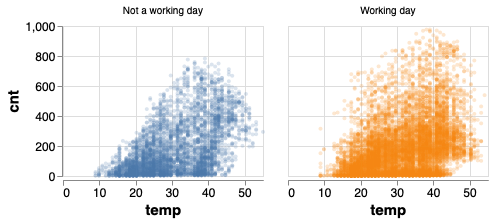

In [33]:
bike_data3 = bike_data
bike_data3['workingday'] = bike_data3['workingday'].replace(
                                                    {0: 'Not a working day',
                                                     1: 'Working day'})

chart = alt.Chart(bike_data).mark_point(opacity=0.2, size = 4).encode(
            x = alt.X('temp:Q',
                    title = "Temperature"),
            y = alt.Y('cnt:Q',
                    title = "Number of bikes"),
            color = alt.Color('workingday:N', legend=None)
        ).properties(title="Temp vs Bike Rental",
                    width=200, height=150
         ).facet(alt.Facet('workingday:N', 
                           sort = order_of_days, title=None),
                 columns=3
        ).configure_axisX(labelFontSize=12,
                        titleFontSize=15
        ).configure_axisY(labelFontSize=12,
                        titleFontSize=15
        ).configure_title(fontSize=17)
chart
#chart.save("fig_2b_temp.png", scale_factor=2.0)

### 7.2 Analysis of hour and weekday on bike rental count 

With the previous analysis, we can think that people use the rental bikes for different objectives in the function of the day of the week. This is a good point to arise another question: does the hour also affect the demand for bike rentals?

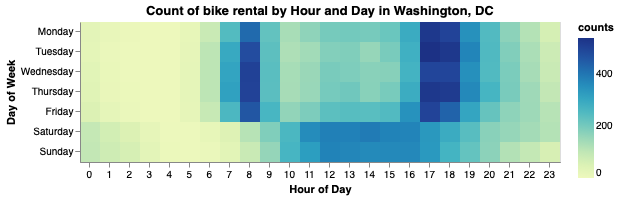

In [70]:

heat_map = alt.Chart(bike_data_2).mark_rect().encode(
                x = alt.X("hr:O", 
                          title = "Hour of Day", 
                          axis = alt.Axis(labelAngle = 0)),
                y = alt.Y('weekday:O',
                          sort=order_of_days,
                          title = "Day of Week"),
                color=alt.Color('cnt:Q', 
                                legend=alt.Legend(title = "counts"),
                                scale=alt.Scale(zero=True)),
                tooltip=['weekday', 'hr', 'cnt']
            ).properties(title = "Count of bike rental by Hour and Day in Washington, DC")
heat_map

**Observations**: In the previous plot we can confirm the hypothesis that people use the bike rentals mainly for work and school on the weekdays showing the peak of the demand in two times of the day: in the morning around 8 hr., and the afternoon between 17 and 18 hr.; on the weekends people use the rental bikes between 11 and 16 hours.  
In the other hand, the time with the lowest demand of rental bikes is between 1 and 5 hr. everyday.

### 7.3 Analysis of weather and humidity on demand for rental bikes

To rent or not to rent a bike, that is the question. And the answer would not be only based on temperature, day and time, but also it would be important to think about weather and humidity, because is not the same to ride a bike on a sunny day than in a rainy one.

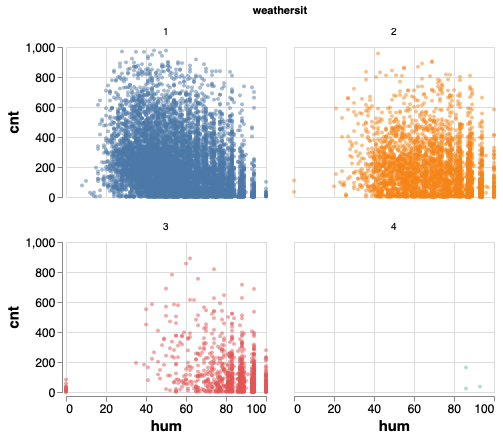

In [71]:
chart = alt.Chart(bike_data).mark_point(opacity=0.5, size = 4).encode(
            alt.X('hum:Q'),
            alt.Y('cnt:Q'),
            color = alt.Color('weathersit:N', legend=None)
        ).properties(title="Temp vs Bike Rental",
                    width=200, height=150
        ).facet(alt.Facet('weathersit:N', 
                          sort = order_of_days),
                columns=2
        ).configure_axisX(labelFontSize=12,
                        titleFontSize=15
        ).configure_axisY(labelFontSize=12,
                        titleFontSize=15
        ).configure_title(fontSize=17)
chart

**Observations**: To understand the previous graphs it will be important to remmember that the weather (`weathersit`) with number 1 is related to a mainly sunny day, while 2 recalls a misty day, a 3 would reference to a lightly rain or snowy day, and 4 with heavy rain, snow or ice.  

In general we could see that people preffer to ride the rental bikes in sunny days, followed by days with mist, and few people rent then on days with light rain, and as it is logic almost nobody rent bikes on days with heavy rain or snow.  
In the other hand, we can observe the demand for bike rental increases in days less humid. 

### 7.3-b Analysis of weather on demand for rental bikes

The previous result make us wander if we should focus only in make an analysis of the rental bikes only by weather, and this is the result:

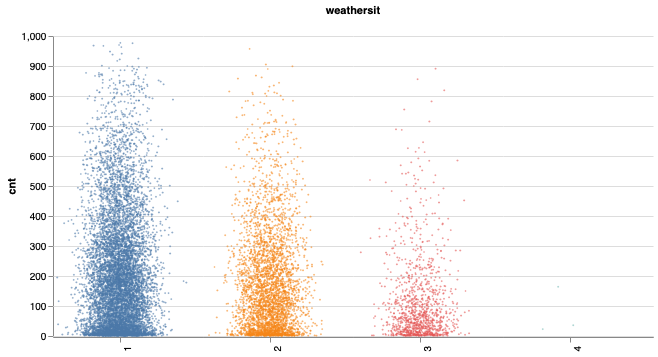

In [78]:
chart_weather2 = alt.Chart(bike_data, width=150).mark_circle(opacity=0.6, size = 4).encode(
                x=alt.X(
                    'jitter:Q',
                    title=None,
                    axis=alt.Axis(values=[0], ticks=True, grid=False, labels=False),
                    scale=alt.Scale()
                ),
                y=alt.Y('cnt:Q'),
                color = alt.Color('weathersit:N', legend=None),
                column=alt.Column(
                    'weathersit:N',
                    header=alt.Header(
                        labelAngle=-90,
                        titleOrient='top',
                        labelOrient='bottom',
                        labelAlign='right',
                        labelPadding=3,
                    ),
                ),
            ).transform_calculate(
                # Generate Gaussian jitter with a Box-Muller transform
                jitter='sqrt(-2*log(random()))*cos(2*PI*random())'
            ).configure_facet(
                spacing=0
            ).configure_view(
                stroke=None
            )

chart_weather2

### 7.4 Correlation matrix 

Which variables are related which each other? That's a question for the correlation matrix!

In [123]:
#sns.set(rc={'figure.figsize':(11,11)})
corrMatrix = bike_data.corr().round(2)
corrMatrix

,season,mnth,hr,holiday,weathersit,temp,atemp,hum,windspeed,cnt
season,1.00,0.83,-0.01,-0.01,-0.02,0.31,0.32,0.15,-0.16,0.18
mnth,0.83,1.00,-0.01,0.01,-0.00,0.20,0.20,0.17,-0.13,0.12
hr,-0.01,-0.01,1.00,-0.00,-0.02,0.13,0.13,-0.28,0.12,0.39
holiday,-0.01,0.01,-0.00,1.00,-0.01,-0.03,-0.04,-0.01,0.01,-0.03
weathersit,-0.02,-0.00,-0.02,-0.01,1.00,-0.10,-0.11,0.42,0.02,-0.14
temp,0.31,0.20,0.13,-0.03,-0.10,1.00,0.99,-0.07,-0.05,0.40
atemp,0.32,0.20,0.13,-0.04,-0.11,0.99,1.00,-0.05,-0.08,0.40
hum,0.15,0.17,-0.28,-0.01,0.42,-0.07,-0.05,1.00,-0.29,-0.32
windspeed,-0.16,-0.13,0.12,0.01,0.02,-0.05,-0.08,-0.29,1.00,0.08
cnt,0.18,0.12,0.39,-0.03,-0.14,0.40,0.40,-0.32,0.08,1.00


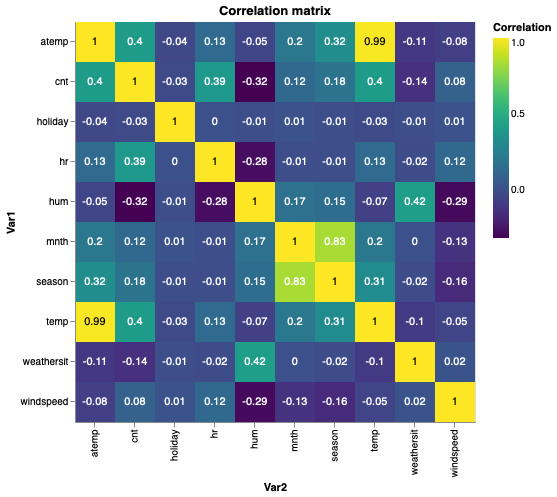

In [124]:
corrMatrix_line = bike_data.corr().round(2).reset_index().rename(columns = {'index':'Var1'}).melt(id_vars = ['Var1'],
                                                                                    value_name = 'Correlation',
                                                                                    var_name = 'Var2')
heatmap = alt.Chart(corrMatrix_line).encode(
    alt.Y('Var1:N'),
    alt.X('Var2:N')
).mark_rect().encode(
     alt.Color('Correlation:Q',
                scale=alt.Scale(scheme='viridis'))
)
text = heatmap.mark_text(baseline='middle').encode(
    text=alt.Text('Correlation:Q', format='.2'),
    color=alt.condition(
        alt.datum.Correlation >= 0.95,
        alt.value('black'),
        alt.value('white')
    )
)
corrMatrix_chart = (heatmap + text).properties(
    width = 400,
    height = 400,
    title = "Correlation matrix"
)
corrMatrix_chart

**Observations**:In the previous table we can find which variables are related with each other. Over all correlations, it stands out the relation between the `month` and the `season` which make sense with a correlation of 0.83.

Additionally, as we could imagine for the previous plots and comments, in this table we can see that for the number of bike rented (`cnt`), there are two variables that stands out for its high correlation with the target variable: the temperature (`temp_actual`) and the hour of the day (`hr`), both with a correlation around 0.40, followed by humidity with a coefficient equals to -0.33.


## References

> Hadi Fanaee-T 
>
> Laboratory of Artificial Intelligence and Decision Support (LIAAD), University of Porto. 
INESC Porto, Campus da FEUP 
Rua Dr. Roberto Frias, 378 
4200 - 465 Porto, Portugal 
>
>Original Source: http://capitalbikeshare.com/system-data  
>Weather Information: http://www.freemeteo.com   
>Holiday Schedule: http://dchr.dc.gov/page/holiday-schedule  